In [1]:
import nbimporter
from data_preparation import *

Importing Jupyter notebook from data_preparation.ipynb


In [2]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import numpy as np
import colorlover as cl
import plotly_express as px

import spacy
spacy.load('es')
spacy.load('en')
spacy.load('fr')
from spacy.lang.es import Spanish
from spacy.lang.en import English
from spacy.lang.fr import French
parser_esp = Spanish()
parser_fr = French()
parser_en = English()

import nltk
nltk.download('wordnet')
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('stopwords')
es_stop = set(nltk.corpus.stopwords.words('spanish'))
en_stop = set(nltk.corpus.stopwords.words('english'))
fr_stop = set(nltk.corpus.stopwords.words('french'))

spacy_stopwords_esp = spacy.lang.es.stop_words.STOP_WORDS
spacy_stopwords_en = spacy.lang.en.stop_words.STOP_WORDS
spacy_stopwords_fr = spacy.lang.fr.stop_words.STOP_WORDS

from langdetect import detect
from wordcloud import WordCloud

import random

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
dataframe_all_en = get_dataframe_analysis_en(True)
dataframe_all_en.head()
dataframe_all_text_en = get_dataframe_analysis_en(False)
dataframe_all_text_en.head()

,Age,Are you able to express verbally the emotions produced by an image you have seen?,"By reusing an image, can you redefine the message that the sender has thought about?",Classify your degree of vision,Do you find this image attractive? Why?,Do you find this image attractive? Why?,Do you find this image attractive? Why?.1,Do you find this image attractive? Why?.2,Do you find this image attractive? Why?.3,"Do you have access to devices (computer, mobile, tablet, etc.) connected to the Internet usually?",...,Which of the paired images do you find most attractive? 1/2 2/2.2,Which of the paired images do you find most attractive? 1/2 2/2.3,Which of the paired images do you find most attractive? 1/2 2/2.4,With whom do you usually share images? [1. Friends],With whom do you usually share images? [2. Family],With whom do you usually share images? [3. Partners],With whom do you usually share images? [4. With all my acquaintances],With whom do you usually share images? [5. With nobody],With whom do you usually share images? [Other],"Within your social networks or mobile applications, do you see visual information that you are not looking for (social awareness campaigns, jokes, advertising, etc.)?"
0,37,3. Occasionally,Yes,3. Medium,"Si, el puente que sostiene al tren","No, me provoca angustia","No, no me interesa","No, demasiado color y no.me.interesa","Si, por el efecto del cohete en la mano",5. Several times a day,...,2/2,2/2,2/2,Yes,Yes,No,No,No,NaN,4. Quite a few times
1,62,3. Occasionally,Yes,3. Medium,Serviría para ilustrar una historia. Quizá una...,Broma de chocolate con leche,"Texturas, personas, no sabemos quienes pero el...",Exhuberancia se recrea en la iconografia con ...,No se discute la hombría de quién de modo tan ...,5. Several times a day,...,2/2,2/2,2/2,Yes,Yes,No,No,No,NaN,5. Almost always or always
2,28,3. Occasionally,Yes,4. Good,"No, no encuentro enfocados elementos que me at...","Sí, es muy curioso el contraste de colores ent...","Sí, me causa curiosidad la situación que se va...","Sí, el color y las metáforas que recoge están ...","Sí, el lanzamiento de cohete con el humo y la ...",5. Several times a day,...,1/2,2/2,2/2,Yes,Yes,No,No,No,NaN,4. Quite a few times
3,31,3. Occasionally,Yes,4. Good,No. No me gusta que se vean las obras al fondo...,"No. Me parece divertida y original, pero no la...",No. No me gusta la Semana Santa aunque ciertam...,"No. Me parece que es recargada, que no está bi...","Sí, me parece que captura el momento, la celeb...",5. Several times a day,...,2/2,2/2,1/2,Yes,Yes,Yes,No,No,NaN,1. Never
4,24,2. Very rarely,Do not know / No answer,4. Good,"No, me transmite mucha tristeza","No, porque la persona sale haciendo el bobo",Si,"Si, por los colores llamativos",No,5. Several times a day,...,2/2,2/2,2/2,Yes,Yes,No,No,No,Pareja,3. Occasionally


In [4]:
dataframe_all_esp = get_dataframe_analysis_esp(True)
dataframe_all_esp.head()
dataframe_all_text_esp = get_dataframe_analysis_esp(False)
dataframe_all_text_esp.head()

,"Al reutilizar una imagen, ¿crees puedes redefinir el mensaje que el emisor ha pensado?",Clasifica tu grado de visión,"Cuando compartes imágenes en redes sociales, ¿las acompañas de texto siguiendo las indicaciones que te sugieren las aplicaciones (etiquetado, explicación de la imagen, texto inspirador, etc.)?","Cuando compartes imágenes, ¿habitualmente las envías a otras personas?","Cuando compartes imágenes, ¿habitualmente las produces tú?","Cuando compartes imágenes, ¿habitualmente las recibes de otras personas?","Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos]","Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil]","Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta]","Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [Otro]",...,¿Repites las imágenes hasta conseguir el resultado esperado?,¿Te gusta seguir a personas que admiras en redes sociales? ¿Eres fan o follower de alguna? ¿En ocasiones escribes comentarios en sus publicaciones?,¿Te resulta atractiva esta imagen? ¿Por qué?,¿Te resulta atractiva esta imagen? ¿Por qué?.1,¿Te resulta atractiva esta imagen? ¿Por qué?.2,¿Te resulta atractiva esta imagen? ¿Por qué?.3,¿Te resulta atractiva esta imagen? ¿Por qué?.4,"¿Tienes acceso a dispositivos (ordenador, móvil, tablet, etc.) conectados a Internet habitualmente?","¿Tienes alguna carencia visual que afecte a la recepción de formas, colores, distancias, etc.?",¿Utilizas gafas o lentes de contacto?
0,Sí,3. Regular,1. Nunca,3. En ocasiones,4. Muchas veces envío imágenes que hago yo,3. En ocasiones,No,Sí,No,NaN,...,Sí,3. A veces interactúo con sus publicaciones en...,"Si, el puente que sostiene al tren","No, no me interesa","No, demasiado color y no.me.interesa","Si, por el efecto del cohete en la mano","No, me provoca angustia",5. Varias veces al día,No,Sí
1,Sí,3. Regular,3. En ocasiones,5. Casi siempre o siempre,4. Muchas veces envío imágenes que hago yo,5. Casi siempre o siempre,No,Sí,No,NaN,...,No,1. No soy fan de nadie a quien admire,Serviría para ilustrar una historia. Quizá una...,"Texturas, personas, no sabemos quienes pero el...",Exhuberancia se recrea en la iconografia con ...,No se discute la hombría de quién de modo tan ...,Broma de chocolate con leche,5. Varias veces al día,No,Sí
2,Sí,4. Bueno,3. En ocasiones,3. En ocasiones,4. Muchas veces envío imágenes que hago yo,4. Bastantes veces,No,Sí,No,NaN,...,Sí,3. A veces interactúo con sus publicaciones en...,"No, no encuentro enfocados elementos que me at...","Sí, me causa curiosidad la situación que se va...","Sí, el color y las metáforas que recoge están ...","Sí, el lanzamiento de cohete con el humo y la ...","Sí, es muy curioso el contraste de colores ent...",5. Varias veces al día,No,Sí
3,Sí,4. Bueno,5. Casi siempre o siempre,4. Bastantes veces,4. Muchas veces envío imágenes que hago yo,2. Muy pocas veces,Sí,Sí,No,NaN,...,Sí,3. A veces interactúo con sus publicaciones en...,No. No me gusta que se vean las obras al fondo...,No. No me gusta la Semana Santa aunque ciertam...,"No. Me parece que es recargada, que no está bi...","Sí, me parece que captura el momento, la celeb...","No. Me parece divertida y original, pero no la...",5. Varias veces al día,No,Sí
4,NS/NC,4. Bueno,4. Bastantes veces,4. Bastantes veces,3. A veces envío imágenes que hago yo y otras ...,4. Bastantes veces,Sí,Sí,No,NaN,...,Sí,"2. Soy fan, pero no interactúas con sus public...","No, me transmite mucha tristeza",Si,"Si, por los colores llamativos",No,"No, porque la persona sale haciendo el bobo",5. Varias veces al día,No,Sí


In [5]:
def visualize_prosume_all_esp(dataframe):
    newDataframe = dataframe.copy()
    for column in get_prosume_items_esp():
        try:
            print(f'Describiendo la pregunta {column}')
            dict_item = get_data_replacements(str(column))
            if dict_item:
                newDataframe[column] = newDataframe[column].apply(get_data_replacements(str(column)).get)
            display(newDataframe[column].describe())
            print(
                f'Conteo de cada valor en {column} expresada como valor / cantidad')
            display(newDataframe[column].value_counts().sort_index())
            print(
                f'Porcentaje de cada valor en {column} expresado como valor / porcentaje')
            display(newDataframe[column].value_counts(normalize=True).sort_index().round(4) * 100)
            # sns.distplot(workCleanDummiesCluster.loc[workCleanDummiesCluster['cluster'] == selected_cluster][column], kde=False, rug=True);
            data = [go.Bar(x=sorted(newDataframe[column].unique()),
                           y=newDataframe[column].value_counts().reindex(
                               newDataframe[column].unique(), fill_value=0).sort_index(),
                           marker=dict(color=cl.scales['6']['div']['Spectral']))]

            iplot(data)
            plt.show()
        except BaseException:
            pass

In [6]:
def visualize_prosume_all_en(dataframe):
    newDataframe = dataframe.copy()
    for column in get_prosume_items_en():
        try:
            print(f'Describing the feature {column}')
            dict_item = get_data_replacements(str(column))
            if dict_item:
                newDataframe[column] = newDataframe[column].apply(get_data_replacements(str(column)).get)
            display(newDataframe[column].describe())
            print(
                f'Count of each value in {column} expresed as value / amount')
            display(newDataframe[column].value_counts().sort_index())
            print(
                f'Percentage of each value in {column} expresed as value / percentage')
            display(newDataframe[column].value_counts(normalize=True).sort_index().round(4) * 100)
            display(newDataframe[column].value_counts(normalize=True).sort_index().round(4) * 100)
            data = [go.Bar(x=sorted(newDataframe[column].unique()),
                           y=newDataframe[column].value_counts().reindex(
                               newDataframe[column].unique(), fill_value=0).sort_index(),
                           marker=dict(color=cl.scales['6']['div']['Spectral']))]

            iplot(data)
            plt.show()
        except BaseException:
            pass

In [7]:
def tokenize(text, language):
    lda_tokens = []
    if language == 'es':
        tokens = parser_esp(str(text))
    elif language == 'en':
        tokens = parser_en(str(text))
    elif language == 'fr':
        tokens = parser_fr(str(text))

    for token in tokens:
        if token.orth_.isspace():
            continue
        elif token.like_url:
            lda_tokens.append('URL')
        elif token.orth_.startswith('@'):
            lda_tokens.append('SCREEN_NAME')
        else:
            lda_tokens.append(token.lower_)
    return lda_tokens


def get_lemma(word):
    lemma = wn.morphy(word)
    if lemma is None:
        return word
    else:
        return lemma


def get_lemma2(word):
    return WordNetLemmatizer().lemmatize(word)


def prepare_text_for_lda(text, language):
    tokens = tokenize(text, language)
    tokens = [token for token in tokens if len(token) > 4]
    # tokens = [token for token in tokens if token not in es_stop]
    if language == 'es':
        tokens = [token for token in tokens if token not in es_stop]
    elif language == 'en':
        tokens = [token for token in tokens if token not in en_stop]
    elif language == 'fr':
        tokens = [token for token in tokens if token not in fr_stop]
    tokens = [get_lemma(token) for token in tokens]
    return tokens

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(30, 60)

def visualize_text_responses_esp(dataframe, column):
    newDataframe = dataframe.copy()
    response_column = 'tokens-visual-issues-esp'
    print(f'Describiendo la variable: {column}')
    n_responses = newDataframe[column].count()
    print(f'Número de respuestas: {n_responses} ')

    if n_responses > 0:
        list_responses = []
        for line in newDataframe[column]:
            try:
                lang = detect(str(line))
                if lang == 'es':
                    tokens = prepare_text_for_lda(line, 'es')
                elif lang == 'en':
                    tokens = prepare_text_for_lda(line, 'en')
                elif lang == 'fr':
                    tokens = prepare_text_for_lda(line, 'fr')
                else:
                    tokens = prepare_text_for_lda(line, 'en')
            except BaseException:
                tokens = prepare_text_for_lda(line, 'en')

            # tokens = [token.text for token in doc if not token.is_stop]

            # word.lemma_
            list_responses.append(tokens)
        try:
            m = np.asarray(list_responses)
            newDataframe[response_column] = m

            # print(list_responses)
            list_responses2 = list(
                filter(lambda a: str(a) != "['nan']", list_responses))
            # print(list_responses2)

            all_responses = []

            for sublist in list_responses2:
                for item in sublist:
                    all_responses.append(item)

            # responses_series = pd.Series((v[0] for v in list_responses))
            responses_series = pd.Series(all_responses)
            # print(responses_series)

            # display(responses_series.str.lower().value_counts())

            data = [go.Bar(x=sorted(responses_series.str.lower().unique()),
                           y=responses_series.str.lower().value_counts().reindex(
                responses_series.str.lower().unique(), fill_value=0).sort_index(),
                marker=dict(color=cl.interp(cl.scales['9']['div']['Spectral'], responses_series.str.lower().nunique())))]

            iplot(data)
            plt.show()
            # print(all_responses)
            all_responses_text = ' '.join(all_responses)
            # display(all_responses_text)
            wordcloud = WordCloud(font_path='/home/jovyan/fonts/Dosis-Regular.ttf', background_color="white", prefer_horizontal=1, width=800, height=400).generate(all_responses_text)
            # generate word cloud
            # display(responses_series.str.lower().value_counts().to_dict())
            wordcloud.generate_from_frequencies(
                responses_series.str.lower().value_counts().to_dict())

            # show
            print('Wordcloud')
            plt.figure(figsize = (100, 50))
            plt.imshow(wordcloud.recolor(color_func=grey_color_func, random_state=3), interpolation="bilinear")
            plt.axis("off")
            plt.show()
        except BaseException:
            if n_responses == 1:
                print(f'La respuesta recibida no es válida para generar los gráficos')
            else:
                print(f'De las {n_responses} respuestas recibidas, no existe ninguna válida para generar los gráficos')

In [8]:
def compare_multiple_resp_esp(dataframe, items, exclude, x_axis_names):
    temp_dataframe = dataframe.copy()

    if type(exclude) == list:
        items = list(set(items) - set(exclude))
    else:
        items.remove(exclude)

    yes_list = []
    for column in items:
        yes_list.append(temp_dataframe[temp_dataframe[column] == 1][column].count())
    # print(yes_list)
    
    data = [go.Bar(
        x=items,
        y=yes_list,
        marker=dict(color=cl.scales['6']['div']['Spectral']),
    )]
    
    layout = go.Layout(
        barmode='group',
        xaxis=go.layout.XAxis(
            ticktext=x_axis_names,
            tickvals=items,
            title='Opciones de respuesta múltiple'
        ),
        yaxis=go.layout.YAxis(
            title="Total respuestas afirmativas"),
        bargap=0.2,
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
    plt.show()

In [9]:
def compare_multiple_resp_en(dataframe, items, exclude, x_axis_names):
    temp_dataframe = dataframe.copy()

    if type(exclude) == list:
        items = list(set(items) - set(exclude))
    else:
        items.remove(exclude)

    yes_list = []
    for column in items:
        yes_list.append(temp_dataframe[temp_dataframe[column] == 1][column].count())
    # print(yes_list)
    
    data = [go.Bar(
        x=items,
        y=yes_list,
        marker=dict(color=cl.scales['6']['div']['Spectral']),
    )]
    
    layout = go.Layout(
        barmode='group',
        xaxis=go.layout.XAxis(
            ticktext=x_axis_names,
            tickvals=items,
            title='Options for multiple responses'
        ),
        yaxis=go.layout.YAxis(
            title="Total affirmative answers"),
        bargap=0.2,
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
    plt.show()

In [10]:
visualize_prosume_all_esp(dataframe_all_esp)

Describiendo la pregunta Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos]


count     767
unique      2
top        No
freq      476
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos], dtype: object

Conteo de cada valor en Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos] expresada como valor / cantidad


No    476
Sí    291
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos], dtype: int64

Porcentaje de cada valor en Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos] expresado como valor / porcentaje


No    62.06
Sí    37.94
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [1. Cámara de fotos], dtype: float64

Describiendo la pregunta Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil]


count     767
unique      2
top        Sí
freq      699
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil], dtype: object

Conteo de cada valor en Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil] expresada como valor / cantidad


No     68
Sí    699
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil], dtype: int64

Porcentaje de cada valor en Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil] expresado como valor / porcentaje


No     8.87
Sí    91.13
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [2. Teléfono móvil], dtype: float64

Describiendo la pregunta Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta]


count     767
unique      2
top        No
freq      708
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta], dtype: object

Conteo de cada valor en Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta] expresada como valor / cantidad


No    708
Sí     59
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta], dtype: int64

Porcentaje de cada valor en Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta] expresado como valor / porcentaje


No    92.31
Sí     7.69
Name: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [3. Tableta], dtype: float64

Describiendo la pregunta ¿Con qué frecuencia haces fotografías?


count                                767
unique                                 5
top       4. Dos o tres veces por semana
freq                                 302
Name: ¿Con qué frecuencia haces fotografías?, dtype: object

Conteo de cada valor en ¿Con qué frecuencia haces fotografías? expresada como valor / cantidad


1. Nunca                           20
2. Una vez al mes                 106
3. Una vez a la semana            190
4. Dos o tres veces por semana    302
5. A diario                       149
Name: ¿Con qué frecuencia haces fotografías?, dtype: int64

Porcentaje de cada valor en ¿Con qué frecuencia haces fotografías? expresado como valor / porcentaje


1. Nunca                           2.61
2. Una vez al mes                 13.82
3. Una vez a la semana            24.77
4. Dos o tres veces por semana    39.37
5. A diario                       19.43
Name: ¿Con qué frecuencia haces fotografías?, dtype: float64

Describiendo la pregunta Cuando produces imágenes, ¿cuánto tiempo dedicas a prepararlas? (minutos)


count     767.000000
mean       15.207953
std       131.345999
min         0.000000
25%         1.000000
50%         5.000000
75%        10.000000
max      3600.000000
Name: Cuando produces imágenes, ¿cuánto tiempo dedicas a prepararlas? (minutos), dtype: float64

Conteo de cada valor en Cuando produces imágenes, ¿cuánto tiempo dedicas a prepararlas? (minutos) expresada como valor / cantidad


0.0        53
0.3         1
0.5         2
1.0       138
1.2         1
2.0       110
3.0        47
4.0         9
5.0       131
6.0         1
7.0         5
9.0         1
10.0      102
12.0        1
14.0        1
15.0       35
20.0       28
21.0        2
24.0        1
25.0        9
30.0       44
33.0        1
35.0        5
40.0        6
45.0        6
50.0        2
52.0        1
60.0       16
90.0        1
120.0       2
180.0       1
200.0       1
240.0       1
300.0       1
3600.0      1
Name: Cuando produces imágenes, ¿cuánto tiempo dedicas a prepararlas? (minutos), dtype: int64

Porcentaje de cada valor en Cuando produces imágenes, ¿cuánto tiempo dedicas a prepararlas? (minutos) expresado como valor / porcentaje


0.0        6.91
0.3        0.13
0.5        0.26
1.0       17.99
1.2        0.13
2.0       14.34
3.0        6.13
4.0        1.17
5.0       17.08
6.0        0.13
7.0        0.65
9.0        0.13
10.0      13.30
12.0       0.13
14.0       0.13
15.0       4.56
20.0       3.65
21.0       0.26
24.0       0.13
25.0       1.17
30.0       5.74
33.0       0.13
35.0       0.65
40.0       0.78
45.0       0.78
50.0       0.26
52.0       0.13
60.0       2.09
90.0       0.13
120.0      0.26
180.0      0.13
200.0      0.13
240.0      0.13
300.0      0.13
3600.0     0.13
Name: Cuando produces imágenes, ¿cuánto tiempo dedicas a prepararlas? (minutos), dtype: float64

Describiendo la pregunta ¿Repites las imágenes hasta conseguir el resultado esperado?


count     767
unique      2
top        Sí
freq      565
Name: ¿Repites las imágenes hasta conseguir el resultado esperado?, dtype: object

Conteo de cada valor en ¿Repites las imágenes hasta conseguir el resultado esperado? expresada como valor / cantidad


No    202
Sí    565
Name: ¿Repites las imágenes hasta conseguir el resultado esperado?, dtype: int64

Porcentaje de cada valor en ¿Repites las imágenes hasta conseguir el resultado esperado? expresado como valor / porcentaje


No    26.34
Sí    73.66
Name: ¿Repites las imágenes hasta conseguir el resultado esperado?, dtype: float64

Describiendo la pregunta En tu entorno, ¿las personas que utilizan la tecnología crean imágenes y las comparten?


count                    767
unique                     5
top       4. Bastantes veces
freq                     270
Name: En tu entorno, ¿las personas que utilizan la tecnología crean imágenes y las comparten?, dtype: object

Conteo de cada valor en En tu entorno, ¿las personas que utilizan la tecnología crean imágenes y las comparten? expresada como valor / cantidad


1. Nunca                      18
2. Muy pocas veces            63
3. En ocasiones              257
4. Bastantes veces           270
5. Casi siempre o siempre    159
Name: En tu entorno, ¿las personas que utilizan la tecnología crean imágenes y las comparten?, dtype: int64

Porcentaje de cada valor en En tu entorno, ¿las personas que utilizan la tecnología crean imágenes y las comparten? expresado como valor / porcentaje


1. Nunca                      2.35
2. Muy pocas veces            8.21
3. En ocasiones              33.51
4. Bastantes veces           35.20
5. Casi siempre o siempre    20.73
Name: En tu entorno, ¿las personas que utilizan la tecnología crean imágenes y las comparten?, dtype: float64

Describiendo la pregunta Cuando compartes imágenes, ¿habitualmente las recibes de otras personas?


count                 767
unique                  5
top       3. En ocasiones
freq                  317
Name: Cuando compartes imágenes, ¿habitualmente las recibes de otras personas?, dtype: object

Conteo de cada valor en Cuando compartes imágenes, ¿habitualmente las recibes de otras personas? expresada como valor / cantidad


1. Nunca                      22
2. Muy pocas veces           112
3. En ocasiones              317
4. Bastantes veces           239
5. Casi siempre o siempre     77
Name: Cuando compartes imágenes, ¿habitualmente las recibes de otras personas?, dtype: int64

Porcentaje de cada valor en Cuando compartes imágenes, ¿habitualmente las recibes de otras personas? expresado como valor / porcentaje


1. Nunca                      2.87
2. Muy pocas veces           14.60
3. En ocasiones              41.33
4. Bastantes veces           31.16
5. Casi siempre o siempre    10.04
Name: Cuando compartes imágenes, ¿habitualmente las recibes de otras personas?, dtype: float64

Describiendo la pregunta Cuando compartes imágenes, ¿habitualmente las envías a otras personas?


count                 767
unique                  5
top       3. En ocasiones
freq                  325
Name: Cuando compartes imágenes, ¿habitualmente las envías a otras personas?, dtype: object

Conteo de cada valor en Cuando compartes imágenes, ¿habitualmente las envías a otras personas? expresada como valor / cantidad


1. Nunca                      24
2. Muy pocas veces           108
3. En ocasiones              325
4. Bastantes veces           233
5. Casi siempre o siempre     77
Name: Cuando compartes imágenes, ¿habitualmente las envías a otras personas?, dtype: int64

Porcentaje de cada valor en Cuando compartes imágenes, ¿habitualmente las envías a otras personas? expresado como valor / porcentaje


1. Nunca                      3.13
2. Muy pocas veces           14.08
3. En ocasiones              42.37
4. Bastantes veces           30.38
5. Casi siempre o siempre    10.04
Name: Cuando compartes imágenes, ¿habitualmente las envías a otras personas?, dtype: float64

Describiendo la pregunta Cuando compartes imágenes, ¿habitualmente las produces tú?


count                                                   767
unique                                                    5
top       3. A veces envío imágenes que hago yo y otras ...
freq                                                    401
Name: Cuando compartes imágenes, ¿habitualmente las produces tú?, dtype: object

Conteo de cada valor en Cuando compartes imágenes, ¿habitualmente las produces tú? expresada como valor / cantidad


1. Siempre reenvío imágenes que me envían                                                32
2. Muchas veces reenvío imágenes que me envían                                          102
3. A veces envío imágenes que hago yo y otras veces no, la proporción es equilibrada    401
4. Muchas veces envío imágenes que hago yo                                              196
5. Siempre mando imágenes que hago yo                                                    36
Name: Cuando compartes imágenes, ¿habitualmente las produces tú?, dtype: int64

Porcentaje de cada valor en Cuando compartes imágenes, ¿habitualmente las produces tú? expresado como valor / porcentaje


1. Siempre reenvío imágenes que me envían                                                4.17
2. Muchas veces reenvío imágenes que me envían                                          13.30
3. A veces envío imágenes que hago yo y otras veces no, la proporción es equilibrada    52.28
4. Muchas veces envío imágenes que hago yo                                              25.55
5. Siempre mando imágenes que hago yo                                                    4.69
Name: Cuando compartes imágenes, ¿habitualmente las produces tú?, dtype: float64

Describiendo la pregunta Dentro de tus redes sociales o aplicaciones móviles, ¿se comparte información visual que tú no buscas (campañas de concienciación social, chistes, publicidad, etc.)?


count                    767
unique                     5
top       4. Bastantes veces
freq                     260
Name: Dentro de tus redes sociales o aplicaciones móviles, ¿se comparte información visual que tú no buscas (campañas de concienciación social, chistes, publicidad, etc.)?, dtype: object

Conteo de cada valor en Dentro de tus redes sociales o aplicaciones móviles, ¿se comparte información visual que tú no buscas (campañas de concienciación social, chistes, publicidad, etc.)? expresada como valor / cantidad


1. Nunca                      29
2. Muy pocas veces            96
3. En ocasiones              227
4. Bastantes veces           260
5. Casi siempre o siempre    155
Name: Dentro de tus redes sociales o aplicaciones móviles, ¿se comparte información visual que tú no buscas (campañas de concienciación social, chistes, publicidad, etc.)?, dtype: int64

Porcentaje de cada valor en Dentro de tus redes sociales o aplicaciones móviles, ¿se comparte información visual que tú no buscas (campañas de concienciación social, chistes, publicidad, etc.)? expresado como valor / porcentaje


1. Nunca                      3.78
2. Muy pocas veces           12.52
3. En ocasiones              29.60
4. Bastantes veces           33.90
5. Casi siempre o siempre    20.21
Name: Dentro de tus redes sociales o aplicaciones móviles, ¿se comparte información visual que tú no buscas (campañas de concienciación social, chistes, publicidad, etc.)?, dtype: float64

Describiendo la pregunta Si encuentras esta información visual sugerida, ¿cómo actúas?


count                                         767
unique                                          2
top       1. No accedo a la información propuesta
freq                                          443
Name: Si encuentras esta información visual sugerida, ¿cómo actúas?, dtype: object

Conteo de cada valor en Si encuentras esta información visual sugerida, ¿cómo actúas? expresada como valor / cantidad


1. No accedo a la información propuesta    443
2. Accedo a la información propuesta       324
Name: Si encuentras esta información visual sugerida, ¿cómo actúas?, dtype: int64

Porcentaje de cada valor en Si encuentras esta información visual sugerida, ¿cómo actúas? expresado como valor / porcentaje


1. No accedo a la información propuesta    57.76
2. Accedo a la información propuesta       42.24
Name: Si encuentras esta información visual sugerida, ¿cómo actúas?, dtype: float64

Describiendo la pregunta Si tienes que crear una presentación de contenidos...


count                                                   767
unique                                                    2
top       1. Busco imágenes para ilustrar lo que estoy d...
freq                                                    557
Name: Si tienes que crear una presentación de contenidos..., dtype: object

Conteo de cada valor en Si tienes que crear una presentación de contenidos... expresada como valor / cantidad


1. Busco imágenes para ilustrar lo que estoy diciendo.    557
2. Las genero yo                                          210
Name: Si tienes que crear una presentación de contenidos..., dtype: int64

Porcentaje de cada valor en Si tienes que crear una presentación de contenidos... expresado como valor / porcentaje


1. Busco imágenes para ilustrar lo que estoy diciendo.    72.62
2. Las genero yo                                          27.38
Name: Si tienes que crear una presentación de contenidos..., dtype: float64

Describiendo la pregunta Si las buscas en Internet...


count                                                   767
unique                                                    3
top       1. Busco en Google Imágenes. No tengo en cuent...
freq                                                    340
Name: Si las buscas en Internet..., dtype: object

Conteo de cada valor en Si las buscas en Internet... expresada como valor / cantidad


1. Busco en Google Imágenes. No tengo en cuenta la licencia de la imagen que utilizo    340
2. Busco en Google Imágenes. Tengo en cuenta la licencia de la imagen que utilizo       308
3. Busco en web especializadas en imágenes. Conozco y uso contenidos con licencias      119
Name: Si las buscas en Internet..., dtype: int64

Porcentaje de cada valor en Si las buscas en Internet... expresado como valor / porcentaje


1. Busco en Google Imágenes. No tengo en cuenta la licencia de la imagen que utilizo    44.33
2. Busco en Google Imágenes. Tengo en cuenta la licencia de la imagen que utilizo       40.16
3. Busco en web especializadas en imágenes. Conozco y uso contenidos con licencias      15.51
Name: Si las buscas en Internet..., dtype: float64

Describiendo la pregunta ¿Cuándo prosumes (produces y consumes) imágenes?


count                                767
unique                                 5
top       4. Dos o tres veces por semana
freq                                 226
Name: ¿Cuándo prosumes (produces y consumes) imágenes?, dtype: object

Conteo de cada valor en ¿Cuándo prosumes (produces y consumes) imágenes? expresada como valor / cantidad


1. Nunca                           33
2. Una vez al mes                 172
3. Una vez a la semana            195
4. Dos o tres veces por semana    226
5. A diario                       141
Name: ¿Cuándo prosumes (produces y consumes) imágenes?, dtype: int64

Porcentaje de cada valor en ¿Cuándo prosumes (produces y consumes) imágenes? expresado como valor / porcentaje


1. Nunca                           4.30
2. Una vez al mes                 22.43
3. Una vez a la semana            25.42
4. Dos o tres veces por semana    29.47
5. A diario                       18.38
Name: ¿Cuándo prosumes (produces y consumes) imágenes?, dtype: float64

Describiendo la pregunta Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [1. Para que se entienda mejor el significado de lo que quiero expresar]


count     767
unique      2
top        No
freq      480
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [1. Para que se entienda mejor el significado de lo que quiero expresar], dtype: object

Conteo de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [1. Para que se entienda mejor el significado de lo que quiero expresar] expresada como valor / cantidad


No    480
Sí    287
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [1. Para que se entienda mejor el significado de lo que quiero expresar], dtype: int64

Porcentaje de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [1. Para que se entienda mejor el significado de lo que quiero expresar] expresado como valor / porcentaje


No    62.58
Sí    37.42
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [1. Para que se entienda mejor el significado de lo que quiero expresar], dtype: float64

Describiendo la pregunta Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [2. Para explicar mejor dónde me encuentro]


count     767
unique      2
top        No
freq      553
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [2. Para explicar mejor dónde me encuentro], dtype: object

Conteo de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [2. Para explicar mejor dónde me encuentro] expresada como valor / cantidad


No    553
Sí    214
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [2. Para explicar mejor dónde me encuentro], dtype: int64

Porcentaje de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [2. Para explicar mejor dónde me encuentro] expresado como valor / porcentaje


No    72.1
Sí    27.9
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [2. Para explicar mejor dónde me encuentro], dtype: float64

Describiendo la pregunta Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [3. Para expresar emociones]


count     767
unique      2
top        No
freq      392
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [3. Para expresar emociones], dtype: object

Conteo de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [3. Para expresar emociones] expresada como valor / cantidad


No    392
Sí    375
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [3. Para expresar emociones], dtype: int64

Porcentaje de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [3. Para expresar emociones] expresado como valor / porcentaje


No    51.11
Sí    48.89
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [3. Para expresar emociones], dtype: float64

Describiendo la pregunta Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [4. Para ahorrar palabras]


count     767
unique      2
top        No
freq      589
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [4. Para ahorrar palabras], dtype: object

Conteo de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [4. Para ahorrar palabras] expresada como valor / cantidad


No    589
Sí    178
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [4. Para ahorrar palabras], dtype: int64

Porcentaje de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [4. Para ahorrar palabras] expresado como valor / porcentaje


No    76.79
Sí    23.21
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [4. Para ahorrar palabras], dtype: float64

Describiendo la pregunta Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [5. Para compartir momentos]


count     767
unique      2
top        No
freq      389
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [5. Para compartir momentos], dtype: object

Conteo de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [5. Para compartir momentos] expresada como valor / cantidad


No    389
Sí    378
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [5. Para compartir momentos], dtype: int64

Porcentaje de cada valor en Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [5. Para compartir momentos] expresado como valor / porcentaje


No    50.72
Sí    49.28
Name: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [5. Para compartir momentos], dtype: float64

Describiendo la pregunta Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [1. No me gustan]


count     767
unique      2
top        No
freq      717
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [1. No me gustan], dtype: object

Conteo de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [1. No me gustan] expresada como valor / cantidad


No    717
Sí     50
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [1. No me gustan], dtype: int64

Porcentaje de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [1. No me gustan] expresado como valor / porcentaje


No    93.48
Sí     6.52
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [1. No me gustan], dtype: float64

Describiendo la pregunta Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [2. No sé cómo se hacen]


count     767
unique      2
top        No
freq      723
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [2. No sé cómo se hacen], dtype: object

Conteo de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [2. No sé cómo se hacen] expresada como valor / cantidad


No    723
Sí     44
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [2. No sé cómo se hacen], dtype: int64

Porcentaje de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [2. No sé cómo se hacen] expresado como valor / porcentaje


No    94.26
Sí     5.74
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [2. No sé cómo se hacen], dtype: float64

Describiendo la pregunta Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [3. No uso la tecnología]


count     767
unique      2
top        No
freq      721
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [3. No uso la tecnología], dtype: object

Conteo de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [3. No uso la tecnología] expresada como valor / cantidad


No    721
Sí     46
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [3. No uso la tecnología], dtype: int64

Porcentaje de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [3. No uso la tecnología] expresado como valor / porcentaje


No    94.0
Sí     6.0
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [3. No uso la tecnología], dtype: float64

Describiendo la pregunta Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [4. Cuando las comparto no sé qué significan]


count     767
unique      2
top        No
freq      692
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [4. Cuando las comparto no sé qué significan], dtype: object

Conteo de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [4. Cuando las comparto no sé qué significan] expresada como valor / cantidad


No    692
Sí     75
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [4. Cuando las comparto no sé qué significan], dtype: int64

Porcentaje de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [4. Cuando las comparto no sé qué significan] expresado como valor / porcentaje


No    90.22
Sí     9.78
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [4. Cuando las comparto no sé qué significan], dtype: float64

Describiendo la pregunta Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [5. Porque ocupan mucho espacio]


count     767
unique      2
top        No
freq      676
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [5. Porque ocupan mucho espacio], dtype: object

Conteo de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [5. Porque ocupan mucho espacio] expresada como valor / cantidad


No    676
Sí     91
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [5. Porque ocupan mucho espacio], dtype: int64

Porcentaje de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [5. Porque ocupan mucho espacio] expresado como valor / porcentaje


No    88.14
Sí    11.86
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [5. Porque ocupan mucho espacio], dtype: float64

Describiendo la pregunta Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [6. Me parece inútil]


count     767
unique      2
top        No
freq      723
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [6. Me parece inútil], dtype: object

Conteo de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [6. Me parece inútil] expresada como valor / cantidad


No    723
Sí     44
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [6. Me parece inútil], dtype: int64

Porcentaje de cada valor en Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [6. Me parece inútil] expresado como valor / porcentaje


No    94.26
Sí     5.74
Name: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [6. Me parece inútil], dtype: float64

Describiendo la pregunta ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [1. Imágenes que realizo para mantener las redes activas]


count     767
unique      2
top        No
freq      571
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [1. Imágenes que realizo para mantener las redes activas], dtype: object

Conteo de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [1. Imágenes que realizo para mantener las redes activas] expresada como valor / cantidad


No    571
Sí    196
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [1. Imágenes que realizo para mantener las redes activas], dtype: int64

Porcentaje de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [1. Imágenes que realizo para mantener las redes activas] expresado como valor / porcentaje


No    74.45
Sí    25.55
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [1. Imágenes que realizo para mantener las redes activas], dtype: float64

Describiendo la pregunta ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [2. Imágenes del día a día, que forman parte de mí vida, las utilizo para expresarme]


count     767
unique      2
top        Sí
freq      402
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [2. Imágenes del día a día, que forman parte de mí vida, las utilizo para expresarme], dtype: object

Conteo de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [2. Imágenes del día a día, que forman parte de mí vida, las utilizo para expresarme] expresada como valor / cantidad


No    365
Sí    402
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [2. Imágenes del día a día, que forman parte de mí vida, las utilizo para expresarme], dtype: int64

Porcentaje de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [2. Imágenes del día a día, que forman parte de mí vida, las utilizo para expresarme] expresado como valor / porcentaje


No    47.59
Sí    52.41
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [2. Imágenes del día a día, que forman parte de mí vida, las utilizo para expresarme], dtype: float64

Describiendo la pregunta ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [3. Imágenes referenciales con el fin de mostrar algo de forma informativa]


count     767
unique      2
top        No
freq      416
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [3. Imágenes referenciales con el fin de mostrar algo de forma informativa], dtype: object

Conteo de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [3. Imágenes referenciales con el fin de mostrar algo de forma informativa] expresada como valor / cantidad


No    416
Sí    351
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [3. Imágenes referenciales con el fin de mostrar algo de forma informativa], dtype: int64

Porcentaje de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [3. Imágenes referenciales con el fin de mostrar algo de forma informativa] expresado como valor / porcentaje


No    54.24
Sí    45.76
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [3. Imágenes referenciales con el fin de mostrar algo de forma informativa], dtype: float64

Describiendo la pregunta ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [4. Imágenes que con las que pretendo causar una reacción (ej. likes)]


count     767
unique      2
top        No
freq      536
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [4. Imágenes que con las que pretendo causar una reacción (ej. likes)], dtype: object

Conteo de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [4. Imágenes que con las que pretendo causar una reacción (ej. likes)] expresada como valor / cantidad


No    536
Sí    231
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [4. Imágenes que con las que pretendo causar una reacción (ej. likes)], dtype: int64

Porcentaje de cada valor en ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [4. Imágenes que con las que pretendo causar una reacción (ej. likes)] expresado como valor / porcentaje


No    69.88
Sí    30.12
Name: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [4. Imágenes que con las que pretendo causar una reacción (ej. likes)], dtype: float64

Describiendo la pregunta ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [1. Amigos]


count     767
unique      2
top        Sí
freq      620
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [1. Amigos], dtype: object

Conteo de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [1. Amigos] expresada como valor / cantidad


No    147
Sí    620
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [1. Amigos], dtype: int64

Porcentaje de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [1. Amigos] expresado como valor / porcentaje


No    19.17
Sí    80.83
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [1. Amigos], dtype: float64

Describiendo la pregunta ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [2. Familia]


count     767
unique      2
top        Sí
freq      596
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [2. Familia], dtype: object

Conteo de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [2. Familia] expresada como valor / cantidad


No    171
Sí    596
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [2. Familia], dtype: int64

Porcentaje de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [2. Familia] expresado como valor / porcentaje


No    22.29
Sí    77.71
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [2. Familia], dtype: float64

Describiendo la pregunta ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [3. Compañeros]


count     767
unique      2
top        No
freq      466
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [3. Compañeros], dtype: object

Conteo de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [3. Compañeros] expresada como valor / cantidad


No    466
Sí    301
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [3. Compañeros], dtype: int64

Porcentaje de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [3. Compañeros] expresado como valor / porcentaje


No    60.76
Sí    39.24
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [3. Compañeros], dtype: float64

Describiendo la pregunta ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [4. Con todos mis conocidos]


count     767
unique      2
top        No
freq      590
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [4. Con todos mis conocidos], dtype: object

Conteo de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [4. Con todos mis conocidos] expresada como valor / cantidad


No    590
Sí    177
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [4. Con todos mis conocidos], dtype: int64

Porcentaje de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [4. Con todos mis conocidos] expresado como valor / porcentaje


No    76.92
Sí    23.08
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [4. Con todos mis conocidos], dtype: float64

Describiendo la pregunta ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [5. Con nadie]


count     767
unique      2
top        No
freq      743
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [5. Con nadie], dtype: object

Conteo de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [5. Con nadie] expresada como valor / cantidad


No    743
Sí     24
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [5. Con nadie], dtype: int64

Porcentaje de cada valor en ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [5. Con nadie] expresado como valor / porcentaje


No    96.87
Sí     3.13
Name: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [5. Con nadie], dtype: float64

Describiendo la pregunta Cuando produces imágenes, ¿piensas en la imagen que quieres crear antes de hacerla?


count                 767
unique                  5
top       3. En ocasiones
freq                  272
Name: Cuando produces imágenes, ¿piensas en la imagen que quieres crear antes de hacerla?, dtype: object

Conteo de cada valor en Cuando produces imágenes, ¿piensas en la imagen que quieres crear antes de hacerla? expresada como valor / cantidad


1. Nunca                      36
2. Muy pocas veces            89
3. En ocasiones              272
4. Bastantes veces           228
5. Casi siempre o siempre    142
Name: Cuando produces imágenes, ¿piensas en la imagen que quieres crear antes de hacerla?, dtype: int64

Porcentaje de cada valor en Cuando produces imágenes, ¿piensas en la imagen que quieres crear antes de hacerla? expresado como valor / porcentaje


1. Nunca                      4.69
2. Muy pocas veces           11.60
3. En ocasiones              35.46
4. Bastantes veces           29.73
5. Casi siempre o siempre    18.51
Name: Cuando produces imágenes, ¿piensas en la imagen que quieres crear antes de hacerla?, dtype: float64

Describiendo la pregunta ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)?


count                                   767
unique                                    5
top       2. Casi todo por medios digitales
freq                                    355
Name: ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)?, dtype: object

Conteo de cada valor en ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)? expresada como valor / cantidad


1. Todo de medios digitales                      124
2. Casi todo por medios digitales                355
3. Por igual de medios digitales y analógicos    217
4. Casi todo de medios analógicos                 59
5. Todo de medios analógicos                      12
Name: ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)?, dtype: int64

Porcentaje de cada valor en ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)? expresado como valor / porcentaje


1. Todo de medios digitales                      16.17
2. Casi todo por medios digitales                46.28
3. Por igual de medios digitales y analógicos    28.29
4. Casi todo de medios analógicos                 7.69
5. Todo de medios analógicos                      1.56
Name: ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)?, dtype: float64

In [11]:
# visualize_reception_images_all_en(dataframe_all_en)

In [12]:
compare_multiple_resp_esp(dataframe_all_esp, 
                                           get_device_use_multiple_items_esp(), 
                                           'Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [Otro]', 
                                           ['Cámara de fotos', 
                                            'Teléfono móvil', 
                                            'Tableta']
                                          )

In [13]:
# compare_multiple_resp_en(dataframe_all_en, get_device_use_multiple_items_en(),'When you take a picture, what type of capture device do you use? (Multiple answer) [Other]',['Photo camera','Mobile phone','Tablet'])

Describiendo la variable: Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [Otro]
Número de respuestas: 19 


Wordcloud


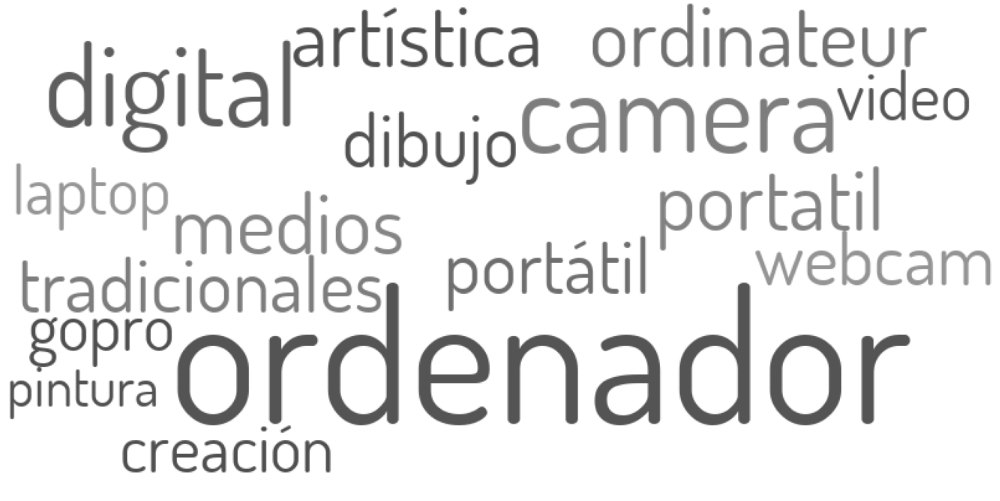

In [14]:
visualize_text_responses_esp(dataframe_all_text_esp, 'Cuando generas una imagen, ¿qué tipo de dispositivo usas? (Respuesta múltiple) [Otro]')

Describiendo la variable: Si las generas tú... [Otro]
Número de respuestas: 6 


Wordcloud


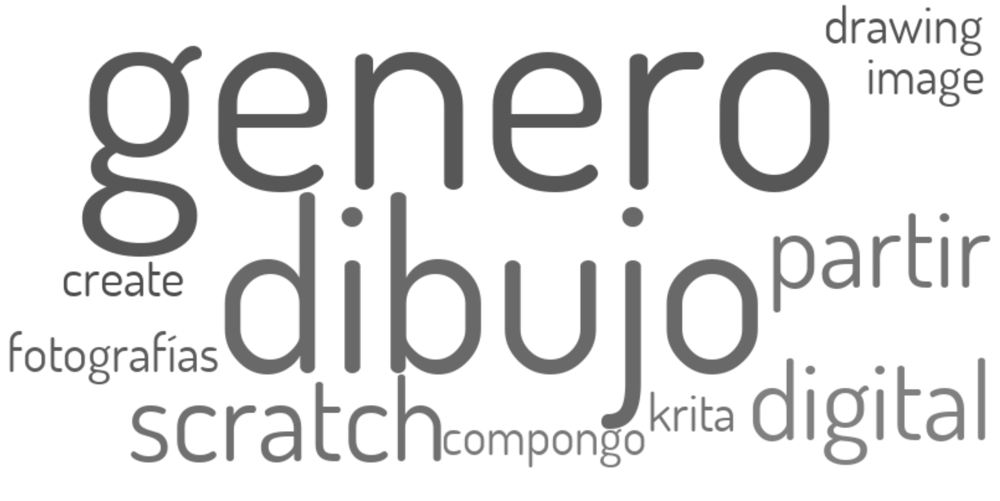

In [15]:
visualize_text_responses_esp(dataframe_all_text_esp, 'Si las generas tú... [Otro]')

In [16]:
compare_multiple_resp_esp(dataframe_all_esp,
                          get_image_production_multiple_items_esp(),
                          'Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [Otro]',
                          ['Para que se entienda <br>mejor el significado de <br>lo que quiero expresar',
                           'Para explicar <br>mejor dónde <br>me encuentro',
                           'Para expresar <br>emociones',
                           'Para ahorrar <br>palabras',
                           'Para compartir <br>momentos']
                          )

In [17]:
# compare_multiple_resp_en(dataframe_all_en, get_image_production_multiple_items_en(),'If you produce images, what do you use for? [Other]',['In order to better understand the meaning of what I want to express','In order to better explain where I am','To express emotions', 'To save words', 'In order to share moments'])

Describiendo la variable: Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [Otro]
Número de respuestas: 28 


Wordcloud


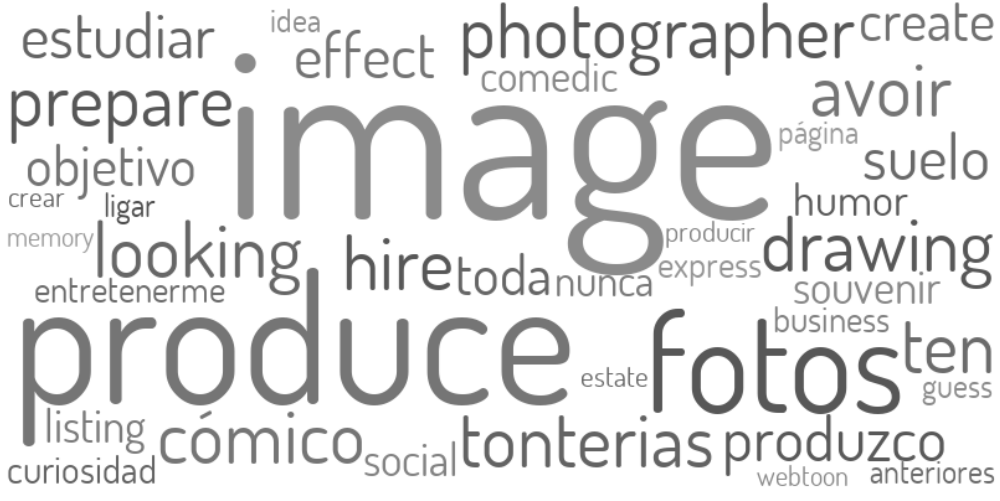

In [18]:
visualize_text_responses_esp(dataframe_all_text_esp, 'Si produces imágenes, ¿para qué las usas? (Respuesta múltiple) [Otro]')

In [19]:
compare_multiple_resp_esp(dataframe_all_esp,
                          get_never_prosume_multiple_items_esp(),
                          'Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [Otro]',
                          ['No me gustan',
                           'No sé cómo <br>se hacen',
                           'No uso la <br>tecnología',
                           'Cuando las comparto <br>no sé qué significan',
                           'Porque ocupan <br>mucho espacio',
                           'Me parece <br>inútil']
                          )

In [20]:
# compare_multiple_resp_en(dataframe_all_en, get_never_prosume_multiple_items_esp(),'If you answered that you NEVER produce or consume images, why do not you use them? (Multiple answer) [Other]',['I do not like','I do not know how they are made','I do not use technology', 'When I share them, I do not know what they mean', 'Because they take up a lot of space', 'I find it useless'])

Describiendo la variable: Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [Otro]
Número de respuestas: 42 


Wordcloud


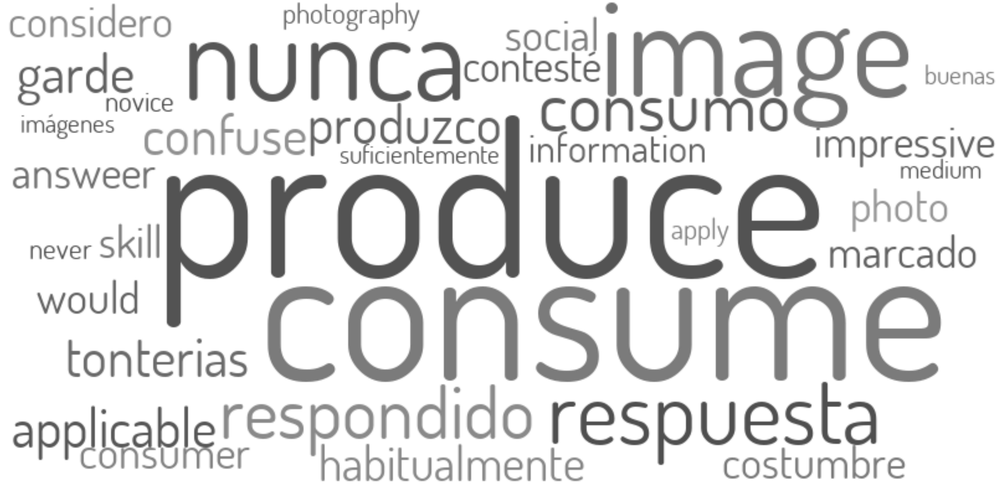

In [21]:
visualize_text_responses_esp(dataframe_all_text_esp, 'Si has respondido que NUNCA produces o consumes imágenes, ¿por qué no las usas? (Respuesta múltiple) [Otro]')

In [22]:
compare_multiple_resp_esp(dataframe_all_esp,
                          get_share_social_networks_images_multiple_items_esp(),
                          '¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [Otro]',
                          ['Imágenes que <br>realizo para mantener <br>las redes activas',
                           'Imágenes del <br>día a día, que forman <br>parte de mi vida, <br>las utilizo para expresarme',
                           'Imágenes referenciales <br>con el fin de mostrar <br>algo de forma informativa',
                           'Imágenes con las <br>que pretendo causar <br>una reacción (ej. likes)']
                          )

In [23]:
# compare_multiple_resp_en(dataframe_all_en,get_share_social_networks_images_multiple_items_en(),'What images do you decide to share in social networks or other technological media? [Other]',['Images I make to keep networks active','Images from day to day, which are part of my life, I use them to express myself','Referential images in order to show something informative','Images with which I intend to cause a reaction (eg. likes)'])

Describiendo la variable: ¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [Otro]
Número de respuestas: 30 


Wordcloud


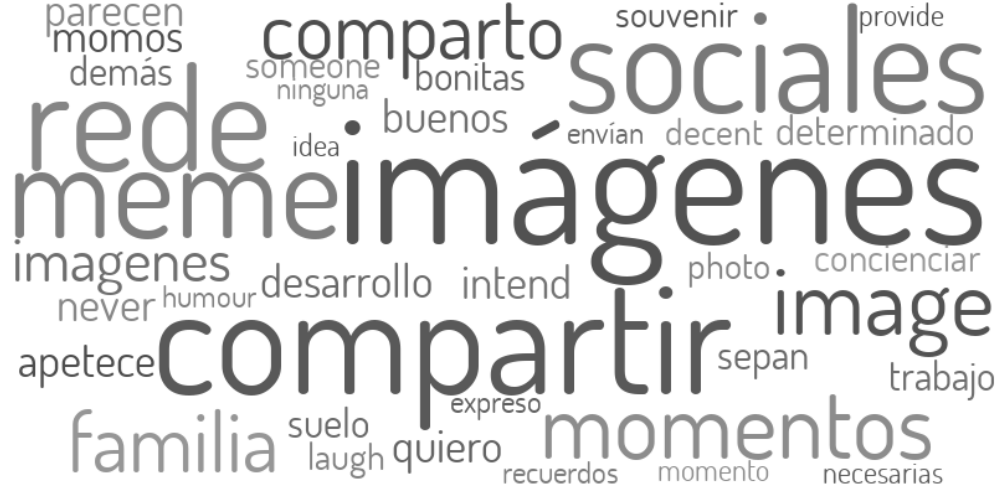

In [24]:
visualize_text_responses_esp(dataframe_all_text_esp, '¿Qué imágenes decides compartir en redes sociales u otros medios tecnológicos? (Respuesta múltiple) [Otro]')

In [25]:
compare_multiple_resp_esp(dataframe_all_esp,
                          get_share_with_whom_multiple_items_esp(),
                          '¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [Otro]',
                          ['Amigos',
                           'Familia',
                           'Compañeros',
                           'Con todos mis conocidos',
                           'Con nadie']
                          )

In [26]:
# compare_multiple_resp_en(dataframe_all_en,get_share_with_whom_multiple_items_en(),'With whom do you usually share images? [Other]',['Friends','Family','Partners','With all my acquaintances','With nobody'])

Describiendo la variable: ¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [Otro]
Número de respuestas: 23 


Wordcloud


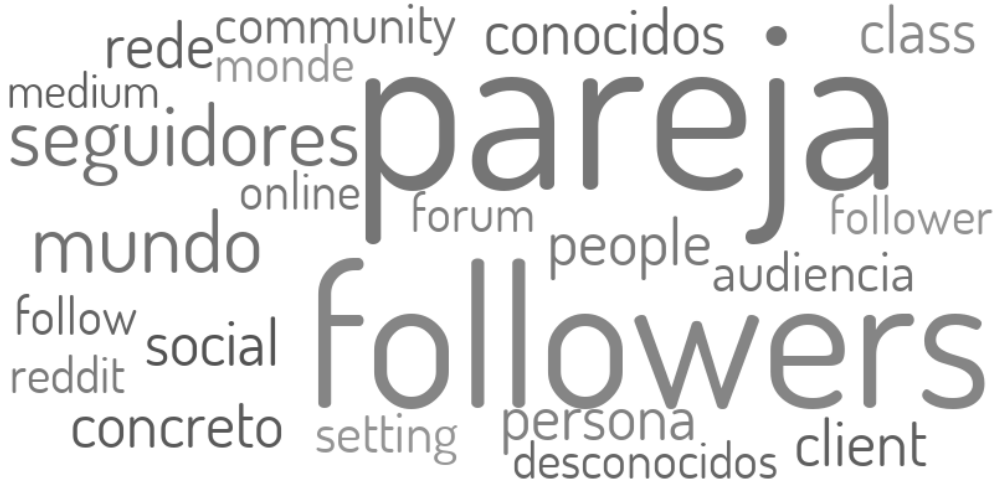

In [27]:
visualize_text_responses_esp(dataframe_all_text_esp, '¿Con quién compartes imágenes generalmente? (Respuesta múltiple) [Otro]')

In [28]:
visualize_text_responses_esp(dataframe_all_text_esp, '¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)? [Otro]')

Describiendo la variable: ¿Cuánto de tu consumo de imágenes viene desde los medios digitales (prensa digital, Internet, televisión, etc.) y cuánto por medios analógicos (prensa escrita, revistas, libros, etc.)? [Otro]
Número de respuestas: 1 
La respuesta recibida no es válida para generar los gráficos
